In [144]:
import pandas as pd
from geopy import Point
from geopy.distance import distance
import seaborn as sns
from functools import lru_cache
import time



In [145]:
cities_df = pd.read_csv("cities.csv")
stations_df = pd.read_csv("stations.csv")
providers_df = pd.read_csv("providers.csv")
tickets_df = pd.read_csv("ticket_data.csv")

In [147]:
tickets_df['o_station'] = tickets_df['o_station'].astype(pd.Int64Dtype())
tickets_df['d_station'] = tickets_df['d_station'].astype(pd.Int64Dtype())

tickets_df['price'] = tickets_df['price_in_cents'].astype(float)/100
tickets_df = tickets_df.drop(columns=['price_in_cents'])

tickets_df.arrival_ts=pd.to_datetime(tickets_df.arrival_ts)
tickets_df.departure_ts=pd.to_datetime(tickets_df.departure_ts)

tickets_df['middle_stations'] = tickets_df['middle_stations'].fillna('{}')
tickets_df['other_companies'] = tickets_df['other_companies'].fillna('{}')
tickets_df

,id,company,o_station,d_station,departure_ts,arrival_ts,search_ts,middle_stations,other_companies,o_city,d_city,price
0,6795025,8385,<NA>,<NA>,2017-10-13 14:00:00+00:00,2017-10-13 20:10:00+00:00,2017-10-01 00:13:31.327+00,{},{},611,542,45.5
1,6795026,9,63,1044,2017-10-13 13:05:00+00:00,2017-10-14 06:55:00+00:00,2017-10-01 00:13:35.773+00,"{149,418}",{13},611,542,14.5
2,6795027,8377,5905,6495,2017-10-13 13:27:00+00:00,2017-10-14 21:24:00+00:00,2017-10-01 00:13:40.212+00,"{798,798,6794,6246}","{8377,8376}",611,542,74.0
3,6795028,8377,5905,6495,2017-10-13 13:27:00+00:00,2017-10-14 11:02:00+00:00,2017-10-01 00:13:40.213+00,"{798,798,6794,6246}","{8377,8376}",611,542,135.0
4,6795029,8381,5905,6495,2017-10-13 21:46:00+00:00,2017-10-14 19:32:00+00:00,2017-10-01 00:13:40.213+00,"{5983,5983}",{8380},611,542,77.1
...,...,...,...,...,...,...,...,...,...,...,...,...
74163,6869182,13,279,10729,2017-10-27 02:30:00+00:00,2017-10-27 16:00:00+00:00,2017-10-19 10:35:42.943+00,"{408,408}",{8371},628,562,25.9
74164,6869185,9,279,304,2017-10-27 07:00:00+00:00,2017-10-27 13:30:00+00:00,2017-10-19 10:35:42.943+00,"{1105,1105}",{9},628,562,27.0
74165,6869187,8371,10642,304,2017-10-27 08:30:00+00:00,2017-10-27 15:15:00+00:00,2017-10-19 10:35:42.943+00,"{1105,1105}",{9},628,562,30.0
74166,6869189,13,279,304,2017-10-27 13:25:00+00:00,2017-10-27 21:10:00+00:00,2017-10-19 10:35:42.943+00,"{863,863}",{13},628,562,28.8


In [148]:
stations_df

,id,unique_name,latitude,longitude
0,1,Aalen (Stuttgarter Straße),48.835296,10.092956
1,2,Aéroport Bordeaux-Mérignac,44.830226,-0.700883
2,3,Aéroport CDG,49.009900,2.559310
3,4,Aéroport de Berlin-Schönefeld,52.389446,13.520345
4,5,Aéroport de Dresden,51.123604,13.764737
...,...,...,...,...
11030,11032,Porto Avda De Los Aliados,41.146922,-8.611122
11031,11033,Rom Ciampino Flughafen Piazzale Leonardo da Vinci,41.804102,12.597110
11032,11034,Sants,41.379892,2.139462
11033,11035,Vozilici D66,45.157136,14.164140


In [149]:
cities_df

,id,local_name,unique_name,latitude,longitude,population
0,5159,"Padua, Veneto, Italia",padua,45.406435,11.876761,209678.0
1,76,"Barcelona, Cataluña, España",barcelona,41.385064,2.173404,1611822.0
2,81,"Basel, Basel-Stadt, Schweiz",basel,47.593437,7.619812,NaN
3,259,"Erlangen, Bayern, Deutschland",erlangen,49.589674,11.011961,105412.0
4,11979,"Balș, Olt, România",balș,44.353354,24.095672,NaN
...,...,...,...,...,...,...
8035,9964,"Saint-André-lez-Lille, Hauts-de-France, France",saint-andre-lez-lille,50.654250,3.047690,NaN
8036,10863,"Kiev, Шевченківський район, Ukraine",kiev,50.450100,30.523400,NaN
8037,11144,"Brighton, England, UK",brighton,50.822000,-0.137400,NaN
8038,11377,"Manises, Comunitat Valenciana, España",manises,39.493000,-0.462100,NaN


In [150]:
providers_df

,id,company_id,provider_id,name,fullname,has_wifi,has_plug,has_adjustable_seats,has_bicycle,transport_type
0,9,1,NaN,ouibus,Ouibus,True,True,True,False,bus
1,10,2,NaN,deinbus,Deinbus.de,False,False,False,False,bus
2,11,3,NaN,infobus,Infobus,False,False,False,False,bus
3,12,4,NaN,studentAgency,Student Agency,False,False,False,False,bus
4,13,5,NaN,flixbus,Flixbus,True,False,False,False,bus
...,...,...,...,...,...,...,...,...,...,...
222,8384,10,16,thalys,Thalys,True,True,False,True,train
223,8385,11,NaN,bbc,Blablacar,False,False,False,False,carpooling
224,8387,30,NaN,vatry,Vatry,NaN,NaN,NaN,NaN,bus
225,8388,40,NaN,beauval,Beauval,NaN,NaN,NaN,NaN,bus


investigate NA stations, carpool??

In [151]:
stations_df['coordinates'] = stations_df.apply(lambda row: Point(latitude=row['latitude'], longitude=row['longitude']), axis=1)
cities_df['coordinates'] = cities_df.apply(lambda row: Point(latitude=row['latitude'], longitude=row['longitude']), axis=1)
stations_df.set_index('id')
cities_df.set_index('id')
providers_df.set_index('id')

,company_id,provider_id,name,fullname,has_wifi,has_plug,has_adjustable_seats,has_bicycle,transport_type
id,,,,,,,,,
9,1,NaN,ouibus,Ouibus,True,True,True,False,bus
10,2,NaN,deinbus,Deinbus.de,False,False,False,False,bus
11,3,NaN,infobus,Infobus,False,False,False,False,bus
12,4,NaN,studentAgency,Student Agency,False,False,False,False,bus
13,5,NaN,flixbus,Flixbus,True,False,False,False,bus
...,...,...,...,...,...,...,...,...,...
8384,10,16,thalys,Thalys,True,True,False,True,train
8385,11,NaN,bbc,Blablacar,False,False,False,False,carpooling
8387,30,NaN,vatry,Vatry,NaN,NaN,NaN,NaN,bus


In [152]:
@lru_cache
def distance_in_km(start, end, city=False):
    if city:
        start_point = cities_df[cities_df['id'] == start].head(1).coordinates
        end_point = cities_df[cities_df['id'] == end].head(1).coordinates
    else:
        start_point = stations_df[stations_df['id'] == start ].head(1).coordinates
        end_point = stations_df[stations_df['id'] == end ].head(1).coordinates
    return distance(start_point, end_point).km

def distance_trip(ticket):
    if pd.isna(ticket.o_station):
        return distance_in_km(ticket.o_city, ticket.d_city, True)
    else:
        trip = [ticket.o_station] + list(map(int, ticket['middle_stations'][1:-1].split(','))) + [ticket.d_station]
        dist = sum([distance_in_km(trip[i+1], trip[i]) for i in range(len(trip)-1)])
        return dist



In [153]:
tickets_df['distance'] = tickets_df.apply(distance_trip, axis=1)
tickets_df['distance_splits'] = pd.cut(tickets_df.distance, [0,200,800, 2000, float("inf")])
tickets_df = tickets_df.join(providers_df[["id","transport_type"]].set_index('id'), on='company')



<AxesSubplot:xlabel='distance', ylabel='distance'>

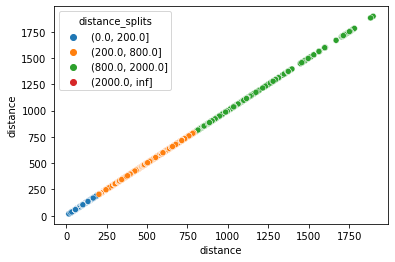

In [154]:
sns.scatterplot(data=tickets_df, x="distance", y="distance", hue="distance_splits")

In [156]:
trajets = tickets_df[['o_city','d_city','distance','price']].merge(cities_df[['unique_name','id']].rename(columns={'id':'id_'}), left_on='o_city', right_on='id_').drop(columns=['id_']).rename(columns={'unique_name':'o_city_name'})
trajets = trajets.merge(cities_df[['unique_name','id']].rename(columns={'id':'id_'}), left_on='d_city', right_on='id_').drop(columns=['id_']).rename(columns={'unique_name':'d_city_name'})

In [164]:
trajets.groupby(["o_city_name","d_city_name"]).agg({'price': ['count','min','mean','max'],
                                        'distance':['min','mean','max']})

price                            \
                                         count    min        mean    max   
o_city_name           d_city_name                                          
aeroport-paris-vatry- troyes                 1   53.0   53.000000   53.0   
agde                  amsterdam              5  186.0  203.200000  220.0   
agen                  dijon                  2   98.6  117.550000  136.5   
                      marseille             30   20.0   40.426667   89.2   
                      marseille-aeroport     6   37.0   38.333333   40.5   
...                                        ...    ...         ...    ...   
villefranche-sur-cher bordeaux              10   30.6   58.850000   76.7   
vitre                 nice                   2  150.7  184.950000  219.2   
zurich                dijon                  4   14.0   18.725000   24.0   
                      liege                  9   40.5   40.966667   41.9   
                      strasbourg             5   14.0   15.900000   17.8   

                                             distance               \
                                                  min         mean   
o_city_name           d_city_name                                    
aeroport-paris-vatry- troyes               272.080355   272.080355   
agde                  amsterdam           1052.910614  1052.910614   
agen                  dijon                578.981782   585.553283   
                      marseille            395.075517   410.979135   
                      marseille-aeroport   380.056318   380.056318   
...                                               ...          ...   
villefranche-sur-cher bordeaux             371.143652   375.230894   
vitre                 nice                 881.721669   894.039001   
zurich                dijon                271.533412   283.214119   
                      liege                422.353621   422.507980   
                      strasbourg           150.735532   150.735532   

                                                       
                                                  max  
o_city_name           d_city_name                      
aeroport-paris-vatry- troyes               272.080355  
agde                  amsterdam           1052.910614  
agen                  dijon                592.124785  
                      marseille            487.994462  
                      marseille-aeroport   380.056318  
...                                               ...  
villefranche-sur-cher bordeaux             380.407521  
vitre                 nice                 906.356334  
zurich                dijon                310.941475  
                      liege                422.585159  
                      strasbourg           150.735532  

[1437 rows x 7 columns]

In [165]:
tickets_df['duration_in_min'] = (tickets_df.arrival_ts-tickets_df.departure_ts).dt.total_seconds()/60

tickets_df['speed_in_kmh'] = tickets_df['distance']/(tickets_df['duration_in_min']/60)
tickets_df['price_per_km'] = tickets_df['price']/tickets_df['distance']
tickets_df[['speed_in_kmh','price_per_km','distance','price','duration_in_min']].head()

,speed_in_kmh,price_per_km,distance,price,duration_in_min
0,81.589756,0.090433,503.136831,45.5,370.0
1,28.513839,0.028515,508.496804,14.5,1070.0
2,33.965028,0.068191,1085.182642,74.0,1917.0
3,50.278732,0.124403,1085.182642,135.0,1295.0
4,28.952643,0.122342,630.202522,77.1,1306.0


In [135]:
tickets_df.groupby(["distance_splits","transport_type"]).agg({'id': ['count'],
                                                            'price_in_cents': 'mean', 
                                                            'duration_in_min':'mean', 
                                                            'speed_in_kmh':'mean', 
                                                            'price_per_km':'mean'})

id price_in_cents duration_in_min  \
                                count           mean            mean   
distance_splits transport_type                                         
(0.0, 200.0]    bus               585    1985.856410      440.588034   
                carpooling      10043    1177.352385      117.122374   
                train            2063    2954.251091      258.632089   
(200.0, 800.0]  bus             11932    3394.816711      888.255196   
                carpooling      31255    3218.064310      285.787874   
                train           16080    8828.501244      447.518657   
(800.0, 2000.0] bus              1281    6813.270101     1628.466823   
                carpooling        143    8626.545455      786.013986   
                train             786   16495.127226      763.595420   
(2000.0, inf]   bus                 0            NaN             NaN   
                carpooling          0            NaN             NaN   
                train               0            NaN             NaN   

                               speed_in_kmh price_per_km  
                                       mean         mean  
distance_splits transport_type                            
(0.0, 200.0]    bus               28.282567    17.462786  
                carpooling        69.653119     8.946808  
                train             48.907606    21.319306  
(200.0, 800.0]  bus               40.032101     7.137210  
                carpooling        76.856410     8.884036  
                train             84.989581    19.722614  
(800.0, 2000.0] bus               43.233675     6.709161  
                carpooling        77.349381     8.758057  
                train             95.541417    17.645008  
(2000.0, inf]   bus                     NaN          NaN  
                carpooling              NaN          NaN  
                train                   NaN          NaN